In [1]:
%cd ../..

/mnt/batch/tasks/shared/LS_root/mounts/clusters/jeffrey-uso9-03-dev-ci01/code/Users/jeffrey.tackes/ModernTS_2E


In [51]:
import os
import shutil
import json

import joblib
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"

from pathlib import Path

from tqdm.autonotebook import tqdm
from IPython.display import display, HTML
# %load_ext autoreload
# %autoreload 2
np.random.seed(42)
tqdm.pandas()

from statsforecast import StatsForecast
from neuralforecast import NeuralForecast
from neuralforecast.models import iTransformer
from neuralforecast.auto import AutoiTransformer
from neuralforecast.losses.pytorch import MQLoss
from utilsforecast.evaluation import evaluate
from utilsforecast.losses import rmse, mae, mse, mase
from neuralforecast.losses.pytorch import MSE, MAE
from functools import partial

from ray import tune
from ray.tune.search.hyperopt import HyperOptSearch


import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("whitegrid")

In [3]:
TRAIN_SUBSAMPLE = True  # Trains a subsample of IDs to improve run speed
RETUNE = True  # if false, will use pre-trained hyperparameters when generating the AUTO NeuralForecast

In [4]:
preprocessed = Path("data/london_smart_meters/preprocessed")
output = Path("data/london_smart_meters/output")
try:
    #Reading the missing value imputed and train test split data
    train_df = pd.read_parquet(preprocessed/"selected_blocks_train_missing_imputed_feature_engg.parquet")
    # Read in the Validation dataset as test_df so that we predict on it
    test_df = pd.read_parquet(preprocessed/"selected_blocks_val_missing_imputed_feature_engg.parquet")
    # test_df = pd.read_parquet(preprocessed/"selected_blocks_test_missing_imputed_feature_engg.parquet")
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. Please make sure you have run 01-Feature Engineering.ipynb in Chapter06
    </div>
    """))

In [5]:
train_df.head(2)

,timestamp,LCLid,energy_consumption,frequency,series_length,stdorToU,Acorn,Acorn_grouped,file,holidays,...,timestamp_Minute_sin_1,timestamp_Minute_sin_2,timestamp_Minute_sin_3,timestamp_Minute_sin_4,timestamp_Minute_sin_5,timestamp_Minute_cos_1,timestamp_Minute_cos_2,timestamp_Minute_cos_3,timestamp_Minute_cos_4,timestamp_Minute_cos_5
0,2012-01-01 00:00:00,MAC000061,0.114,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,1.0,1.0,1.0,1.0
1,2012-01-01 00:30:00,MAC000061,0.113,30min,37872,Std,ACORN-Q,Adversity,block_96,NO_HOLIDAY,...,5.665539e-16,-1.133108e-15,2.143751e-15,-2.266215e-15,6.123234e-16,-1.0,1.0,-1.0,1.0,-1.0


In [6]:
print("Total # of IDs Pre-Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Pre-Sampling:  150


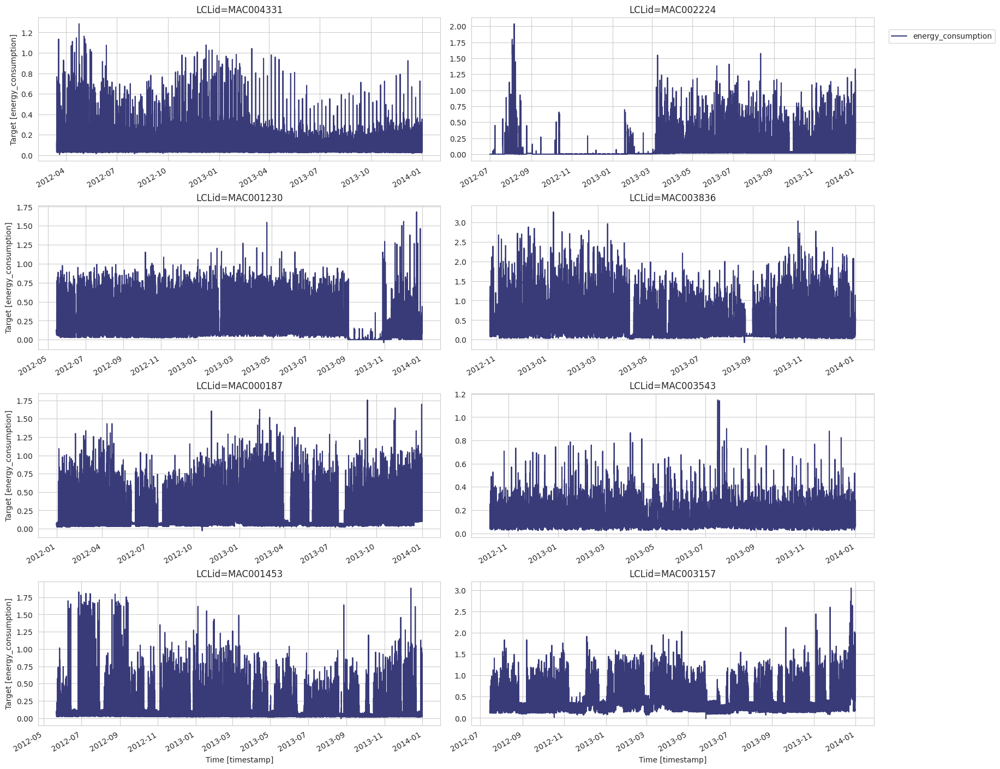

In [7]:
StatsForecast.plot(train_df, engine='matplotlib', id_col='LCLid',time_col= 'timestamp', target_col='energy_consumption')

In [8]:
# To run on smaller set of data for daster iteration.
if TRAIN_SUBSAMPLE:
    print("sub sampling")
    SAMPLE = 10
    sampled_LCLids = pd.Series(train_df.LCLid.unique().remove_unused_categories().categories).sample(SAMPLE, random_state=99).tolist()
    train_df = train_df.loc[train_df.LCLid.isin(sampled_LCLids)]
    test_df = test_df.loc[test_df.LCLid.isin(sampled_LCLids)]

sub sampling


In [9]:
print("Total # of IDs Post Sampling: ", len(train_df.LCLid.unique()))

Total # of IDs Post Sampling:  10


## Train, Validation, Test Set

In [10]:
print("Training Min Date: ", train_df.timestamp.min(), 
      "\nTraining Max Date: ", train_df.timestamp.max(), 
      "\nTesting Min Date: ", test_df.timestamp.min(),
      "\nTesting Max Date: ", test_df.timestamp.max()
)

Training Min Date:  2012-01-01 00:00:00 
Training Max Date:  2013-12-31 23:30:00 
Testing Min Date:  2014-01-01 00:00:00 
Testing Max Date:  2014-01-31 23:30:00


In [11]:
#Keeping 1 days aside as a validation set
cutoff = train_df.timestamp.max() - pd.Timedelta(1, "D")

validation_df = train_df[(train_df.timestamp>cutoff)].reset_index(drop=True) # validation prediction set
training_df = train_df[(train_df.timestamp<=cutoff)].reset_index(drop=True) # training set used for validation set

print(f"Train Max: {training_df.timestamp.max()} \nValidation Min: {validation_df.timestamp.min()} \nValidation Max: {validation_df.timestamp.max()}")
print(f"Validation Horizon: {len(validation_df.timestamp.unique())}")


Train Max: 2013-12-30 23:30:00 
Validation Min: 2013-12-31 00:00:00 
Validation Max: 2013-12-31 23:30:00
Validation Horizon: 48


##### Define Validation model parameters

In [24]:
h = 48
max_steps = 100

## Training iTransformer Model

In [17]:
training_df[['LCLid']].nunique()[0]

10

In [38]:
len(training_df['LCLid'].unique())

10

In [39]:
model_untuned = [iTransformer (h=h, input_size = 48*7, 
                n_series  = len(training_df['LCLid'].unique()))]

model_untuned = NeuralForecast(models=model_untuned, freq='30min')
model_untuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type                   | Params
---------------------------------------------------------
0 | loss          | MAE                    | 0     
1 | padder        | ConstantPad1d          | 0     
2 | scaler        | TemporalNorm           | 0     
3 | enc_embedding | DataEmbedding_inverted | 25.1 K
4 | encoder       | TransEncoder           | 6.3 M 
5 | projector     | Linear                 | 24.6 K
---------------------------------------------------------
6.4 M     Trainable params
0         Non-trainable params
6.4 M     Total params
25.422    Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=1000` reached.


In [40]:
# Get Predictions for validation
pred_df =  model_untuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df.merge(validation_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,iTransformer,energy_consumption
0,MAC000126,2013-12-31 00:00:00,0.103364,0.093
1,MAC000126,2013-12-31 00:30:00,0.085779,0.109
2,MAC000126,2013-12-31 01:00:00,0.087782,0.082
3,MAC000126,2013-12-31 01:30:00,0.080774,0.067
4,MAC000126,2013-12-31 02:00:00,0.085422,0.043


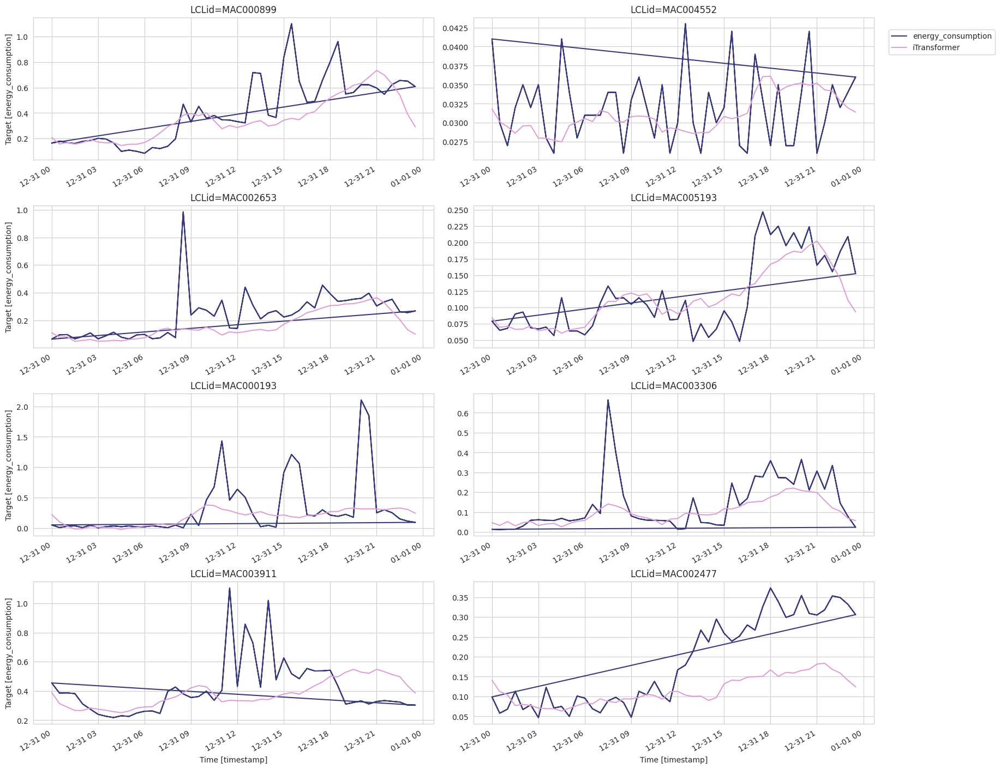

In [41]:
#visualize results
StatsForecast.plot(validation_df[['LCLid','timestamp','energy_consumption']], 
                   pred_df, engine='matplotlib', 
                   id_col='LCLid',
                   time_col= 'timestamp', 
                   target_col='energy_consumption',
                   models=['iTransformer'])

#### Evaluate iTransformer forecast

In [42]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
iTransformer_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
iTransformer_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [43]:
iTransformer_metrics_agg

,metric,iTransformer
0,rmse,0.140138
1,mae,0.085487
2,mse,0.034629
3,mase,0.762584


## iTransformer Tuned
Since hyperparameters are key to performance in Neural Networks, NIXTLA has made this search each through the incorporation of Auto forecast.
Each NeuralForecast model has an AUTO class which allow you to easily tune your hyperparameters.

Auto Forecast can time, you can load the pre-trained hyperparameters or choose to retune on your own.
Set ```RETUNE = True``` if you wish to retune.


In [44]:
# Define the file path
config_file_path = 'notebooks/Chapter16/saved_params_config/iTransformer_best_config.json'
try:
    with open(config_file_path, 'r') as config_file:
        loaded_config = json.load(config_file)
        print(loaded_config)
except FileNotFoundError:
    display(HTML("""
    <div class="alert alert-block alert-warning">
    <b>Warning!</b> File not found. 
    </div>
    """))
    

In [60]:
iTransformer_config = {
    "max_steps": max_steps,  # This parameter can be adjusted if needed
    "input_size": tune.choice([h,h*7,h*7*2,h*7*3]), # Size of input window
    "learning_rate": tune.loguniform(1e-4, 1e-1),  # Initial learning rate
    "scaler_type": tune.choice(["minmax", "standard"]),
    "batch_size": tune.choice([32, 64,128, 256]),
    "hidden_size": tune.choice([32, 64,128, 256]),
    "random_seed": tune.choice([10, 20,30]),
    "n_heads":tune.choice([4, 8,16])

}

if RETUNE == True:
    models = [AutoiTransformer(h=h, 
                     config = iTransformer_config,
                     search_alg = HyperOptSearch(),
                     backend = 'ray',
                     num_samples = 100,
                     #cpus=10,
                     n_series = len(training_df['LCLid'].unique()),
                     loss=MSE(),
                     valid_loss=MAE(),  
                     )]

else:
    models = [AutoiTransformer(h=h, 
                    config = loaded_config,
                    search_alg = None,
                    backend = 'ray',
                    #cpus=1
                    )]


model_tuned = NeuralForecast(models=models, freq='30min')
model_tuned.fit(training_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption',  val_size = 48)

(_train_tune pid=768063) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_205fb1a0_1_batch_size=256,h=48,hidden_size=64,input_size=1008,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-24-21/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------

Sanity Checking DataLoader 0: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 59.45it/s]


2024-08-17 16:24:44,645	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.67it/s, v_num=0, train_loss_step=6.660, train_loss_epoch=3.100]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_09e9e89c_2_batch_size=256,h=48,hidden_size=32,input_size=672,learning_rate=0.0102,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-24-25/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.58it/s, v_num=0, train_loss_step=0.113, train_loss_epoch=0.167]


2024-08-17 16:24:53,662	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_5b6a47e3_3_batch_size=128,h=48,hidden_size=256,input_size=672,learning_rate=0.0042,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-24-44/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=20.30

2024-08-17 16:25:03,606	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.25it/s, v_num=0, train_loss_step=6.790, train_loss_epoch=20.30]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_124e729e_4_batch_size=32,h=48,hidden_size=32,input_size=336,learning_rate=0.0159,loss=ref_ph_de895953,max_steps=100,n__2024-08-17_16-24-53/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.023, train_loss_epoch=0.023]


2024-08-17 16:25:08,372	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_5a006b4a_5_batch_size=256,h=48,hidden_size=32,input_size=1008,learning_rate=0.0052,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-25-03/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 24.49it/s, v_num=0, train_loss_step=0.860, train_loss_epoch=0.023]


2024-08-17 16:25:20,301	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.68it/s, v_num=0, train_loss_step=6.010, train_loss_epoch=6.660]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_20271ebf_6_batch_size=256,h=48,hidden_size=32,input_size=1008,learning_rate=0.0662,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-25-08/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=2.890, train_loss_epoch=2.890]


2024-08-17 16:25:32,857	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.24it/s, v_num=0, train_loss_step=2.470, train_loss_epoch=2.890]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_090bf595_7_batch_size=64,h=48,hidden_size=128,input_size=336,learning_rate=0.0064,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-25-20/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 98:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.612, train_loss_epoch=0.612]


2024-08-17 16:25:38,419	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20.28it/s, v_num=0, train_loss_step=0.878, train_loss_epoch=1.660]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_4463c7e3_8_batch_size=64,h=48,hidden_size=32,input_size=336,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n__2024-08-17_16-25-32/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20.19it/s, v_num=0, train_loss_step=11.80, train_loss_epoch=1.530]


2024-08-17 16:25:43,624	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


(_train_tune pid=768063) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14.14it/s, v_num=0, train_loss_step=11.80, train_loss_epoch

(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_fd5976e5_9_batch_size=64,h=48,hidden_size=256,input_size=672,learning_rate=0.0554,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-25-38/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.87it/s, v_num=0, train_loss_step=1.250, train_loss_epoch=1.210]


2024-08-17 16:25:52,636	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_e19b24c2_10_batch_size=256,h=48,hidden_size=64,input_size=336,learning_rate=0.0054,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-25-43/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.333

2024-08-17 16:25:59,944	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13.43it/s, v_num=0, train_loss_step=0.220, train_loss_epoch=0.333]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_24f0ca56_11_batch_size=32,h=48,hidden_size=128,input_size=336,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-25-52/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=3.010, train_loss_epoch=3.010]


2024-08-17 16:26:05,144	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_0b31a56a_12_batch_size=128,h=48,hidden_size=256,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-25-59/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22.26it/s, v_num=0, train_loss_step=0.0192, train_loss_epoch=3.010]


2024-08-17 16:26:15,433	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.52it/s, v_num=0, train_loss_step=0.114, train_loss_epoch=0.0204]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_db725891_13_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0403,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-26-05/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=3.040, train_loss_epoch=3.040]


2024-08-17 16:26:30,001	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_c55b8d6d_14_batch_size=64,h=48,hidden_size=256,input_size=1008,learning_rate=0.0997,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-26-15/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.79it/s, v_num=0, train_loss_step=2.630, train_loss_epoch=3.040]


2024-08-17 16:26:40,820	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.31it/s, v_num=0, train_loss_step=0.0179, train_loss_epoch=0.0174]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_5283ac42_15_batch_size=128,h=48,hidden_size=32,input_size=336,learning_rate=0.0057,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-26-30/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.484, train_loss_epoch=0.484]


2024-08-17 16:26:46,354	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_f311c718_16_batch_size=32,h=48,hidden_size=128,input_size=336,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-26-40/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 21.10it/s, v_num=0, train_loss_step=0.310, train_loss_epoch=0.484]


2024-08-17 16:26:51,745	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_67028ba0_17_batch_size=128,h=48,hidden_size=128,input_size=48,learning_rate=0.0478,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-26-46/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 20.75it/s, v_num=0, train_loss_step=0.859, train_loss_epoch=0.0225]


2024-08-17 16:26:56,067	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_d4f7c2d6_18_batch_size=64,h=48,hidden_size=128,input_size=336,learning_rate=0.0041,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-26-51/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25.82it/s, v_num=0, train_loss_step=1.120, train_loss_epoch=10.70]


2024-08-17 16:27:02,193	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_61b7c88b_19_batch_size=128,h=48,hidden_size=64,input_size=1008,learning_rate=0.0047,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-26-56/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17.08it/s, v_num=0, train_loss_step=11.70, train_loss_epoch=1.550]


2024-08-17 16:27:12,009	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_68bc40dd_20_batch_size=256,h=48,hidden_size=128,input_size=672,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-27-02/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.27it/s, v_num=0, train_loss_step=0.161, train_loss_epoch=0.0902]


2024-08-17 16:27:22,728	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.86it/s, v_num=0, train_loss_step=12.10, train_loss_epoch=11.70]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_ccb30b58_21_batch_size=128,h=48,hidden_size=256,input_size=672,learning_rate=0.0158,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-27-12/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.66it/s, v_num=0, train_loss_step=0.0366, train_loss_epoch=0.187]


2024-08-17 16:27:32,748	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_afac8296_22_batch_size=128,h=48,hidden_size=256,input_size=672,learning_rate=0.0180,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-27-22/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.77it/s, v_num=0, train_loss_step=0.0377

2024-08-17 16:27:42,285	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_8a23d129_23_batch_size=128,h=48,hidden_size=32,input_size=48,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-27-32/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.20it/s, v_num=0, train_loss_step=5.060

2024-08-17 16:27:46,331	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_825ecfea_24_batch_size=256,h=48,hidden_size=256,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-27-42/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.165

2024-08-17 16:27:59,499	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.30it/s, v_num=0, train_loss_step=0.110, train_loss_epoch=0.165]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_c7b06d07_25_batch_size=256,h=48,hidden_size=32,input_size=672,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-27-46/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0211, train_loss_epoch=0.0211]


2024-08-17 16:28:08,582	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.53it/s, v_num=0, train_loss_step=0.113, train_loss_epoch=0.0211]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_bab06772_26_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-27-59/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.94it/s, v_num=0, train_loss_step=0.0152, train_loss_epoch=0.0141]


2024-08-17 16:28:15,581	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_e3289c2c_27_batch_size=128,h=48,hidden_size=32,input_size=48,learning_rate=0.0105,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-28-08/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 98:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=3.430

2024-08-17 16:28:19,785	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_9805852e_28_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-28-15/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28.13it/s, v_num=0, train_loss_step=5.070, train_loss_epoch=2.870]


2024-08-17 16:28:26,785	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_ad0b1655_29_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0021,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-28-19/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14.84it/s, v_num=0, train_loss_step=0.0152, train_loss_epoch=0.0141]


2024-08-17 16:28:33,898	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_6ca8439b_30_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-28-26/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.65it/s, v_num=0, train_loss_step=0.0154, train_loss_epoch=0.0145]


2024-08-17 16:28:40,986	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_3101c293_31_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-28-33/lightning_logs


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.05it/s, v_num=0, train_loss_step=0.0151, train_loss_epoch=0.0141]


(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm           | 0     
(_train_tune pid=768063) 4 | enc_embedding | DataEmbedding_inverted | 43.1 K
(_train_tune pid=768063) 5 | encoder       | TransEncoder           | 562 K 
(_train_tune pid=768063) 6 | projector     | Linear                 | 3.1 K 
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 608 K     Trainable params
(_train_tune pid=768063) 0         Non-trainable params
(_train_tune pid=768063) 608 K     Total params
(_train_tune pid=768063) 2.434     T

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.06it/s, v_num=0, train_loss_step=0.0153, train_loss_epoch=0.0143]


2024-08-17 16:28:47,957	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_b03e1dc6_32_batch_size=32,h=48,hidden_size=64,input_size=48,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n__2024-08-17_16-28-41/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 35.64it/s, v_num=0, train_loss_step=2.780

2024-08-17 16:28:51,107	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_efcc9397_33_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-28-47/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14.24it/s, v_num=0, train_loss_step=0.0152,

2024-08-17 16:28:58,215	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_357b5248_34_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-28-51/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14.88it/s, v_num=0, train_loss_step=0.0155,

2024-08-17 16:29:05,339	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_3f985860_35_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-28-58/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.12it/s, v_num=0, train_loss_step=0.0155, train_loss_epoch=

2024-08-17 16:29:12,294	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.11it/s, v_num=0, train_loss_step=0.0165, train_loss_epoch=0.0155]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_eb47985a_36_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0011,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-29-05/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.909, train_loss_epoch=0.909]


2024-08-17 16:29:19,316	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_b614e530_37_batch_size=32,h=48,hidden_size=64,input_size=48,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,n__2024-08-17_16-29-12/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.05it/s, v_num=0, train_loss_step=0.960, train_loss_epoch=0.909]


2024-08-17 16:29:22,328	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_0bf41b64_38_batch_size=32,h=48,hidden_size=64,input_size=1008,learning_rate=0.0025,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-29-19/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 37.58it/s, v_num=0, train_loss_step=4.740, train_loss_epoch=0.148]


2024-08-17 16:29:31,289	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_53e18b72_39_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-29-22/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.29it/s, v_num=0, train_loss_step=0.989, train_loss_epoch=1.180]


2024-08-17 16:29:38,365	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.26it/s, v_num=0, train_loss_step=0.0168, train_loss_epoch=0.0156]


(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_f58e2e33_40_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-29-31/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0159, train_loss_epoch=0.0159]


2024-08-17 16:29:45,243	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14.08it/s, v_num=0, train_loss_step=0.0172, train_loss_epoch=0.0159]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_f4397637_41_batch_size=64,h=48,hidden_size=64,input_size=672,learning_rate=0.0011,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-29-38/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=6.890, train_loss_epoch=6.890]


2024-08-17 16:29:53,405	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13.20it/s, v_num=0, train_loss_step=0.926, train_loss_epoch=6.890]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_e46c0b24_42_batch_size=32,h=48,hidden_size=64,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-29-45/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0148, train_loss_epoch=0.0148]


2024-08-17 16:30:02,833	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.88it/s, v_num=0, train_loss_step=0.0169, train_loss_epoch=0.0148]


(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_284edf34_43_batch_size=32,h=48,hidden_size=64,input_size=672,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-29-53/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.30it/s, v_num=0, train_loss_step=0.0165, train_loss_epoch=0.0155]


2024-08-17 16:30:09,787	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_7ab8161f_44_batch_size=64,h=48,hidden_size=64,input_size=1008,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-30-02/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=1.100

2024-08-17 16:30:19,560	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.11it/s, v_num=0, train_loss_step=1.570, train_loss_epoch=1.100]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_ae5c42d7_45_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-30-09/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.89it/s, v_num=0, train_loss_step=0.0164, train_loss_epoch=0.0145]


2024-08-17 16:30:28,799	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_3f3dd648_46_batch_size=32,h=48,hidden_size=32,input_size=1008,learning_rate=0.0014,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-30-19/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0149,

2024-08-17 16:30:37,394	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13.16it/s, v_num=0, train_loss_step=0.0168, train_loss_epoch=0.0149]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_8ee86344_47_batch_size=256,h=48,hidden_size=128,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-30-28/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=6.640, train_loss_epoch=6.640]


2024-08-17 16:30:49,957	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.01it/s, v_num=0, train_loss_step=5.990, train_loss_epoch=6.640]


(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_b7238e83_48_batch_size=64,h=48,hidden_size=128,input_size=1008,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-30-37/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0145, train_loss_epoch=0.0145]


2024-08-17 16:30:59,577	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.81it/s, v_num=0, train_loss_step=0.0661, train_loss_epoch=0.0145]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_8b3fdb6b_49_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0029,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-30-49/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0153, train_loss_epoch=0.0153]


2024-08-17 16:31:09,174	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.36it/s, v_num=0, train_loss_step=0.0168, train_loss_epoch=0.0153]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_ef592548_50_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-30-59/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0144, train_loss_epoch=0.0144]


2024-08-17 16:31:18,398	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.83it/s, v_num=0, train_loss_step=0.0161, train_loss_epoch=0.0144]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_7af43c42_51_batch_size=256,h=48,hidden_size=128,input_size=1008,learning_rate=0.0299,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-31-09/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=6.850, train_loss_epoch=6.850]


2024-08-17 16:31:31,294	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.25it/s, v_num=0, train_loss_step=6.230, train_loss_epoch=6.850]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_c8698559_52_batch_size=64,h=48,hidden_size=128,input_size=1008,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-31-18/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.014, train_loss_epoch=0.014]


2024-08-17 16:31:41,304	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_345fc6a2_53_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0068,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-31-31/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.69it/s, v_num=0, train_loss_step=0.063, train_loss_epoch=0.014]


2024-08-17 16:31:50,577	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_fc2155bc_54_batch_size=64,h=48,hidden_size=128,input_size=336,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-31-41/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Sanity Checking DataLoader 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

2024-08-17 16:31:56,297	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_29d944ad_55_batch_size=64,h=48,hidden_size=128,input_size=1008,learning_rate=0.0014,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-31-50/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 19.19it/s, v_num=0, train_loss_step=0.867, train_loss_epoch=1.640]


2024-08-17 16:32:06,508	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_f81cc0d1_56_batch_size=64,h=48,hidden_size=128,input_size=1008,learning_rate=0.0071,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-31-56/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.015

2024-08-17 16:32:16,145	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_5f66a71b_57_batch_size=64,h=48,hidden_size=128,input_size=1008,learning_rate=0.0037,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-32-06/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.47it/s, v_num=0, train_loss_step=0.0391, train_loss_epoch=0.015]


2024-08-17 16:32:26,064	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_e0240cc8_58_batch_size=64,h=48,hidden_size=128,input_size=336,learning_rate=0.0022,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-32-16/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=1.640

2024-08-17 16:32:32,057	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 18.39it/s, v_num=0, train_loss_step=0.876, train_loss_epoch=1.640]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_73543529_59_batch_size=64,h=48,hidden_size=256,input_size=48,learning_rate=0.0034,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-32-26/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=2.710, train_loss_epoch=2.710]


2024-08-17 16:32:37,189	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 22.17it/s, v_num=0, train_loss_step=128.0, train_loss_epoch=2.710]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_1db191c8_60_batch_size=64,h=48,hidden_size=128,input_size=1008,learning_rate=0.0095,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-32-32/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0161, train_loss_epoch=0.0161]


2024-08-17 16:32:47,212	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.96it/s, v_num=0, train_loss_step=0.0694, train_loss_epoch=0.0161]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_040eb6d0_61_batch_size=128,h=48,hidden_size=128,input_size=1008,learning_rate=0.0996,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-32-37/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.059, train_loss_epoch=0.059]


2024-08-17 16:32:57,843	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.81it/s, v_num=0, train_loss_step=0.0306, train_loss_epoch=0.059]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_229d108c_62_batch_size=256,h=48,hidden_size=32,input_size=336,learning_rate=0.0007,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-32-47/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14.45it/s, v_num=0, train_loss_step=0.625, train_loss_epoch=0.657]


2024-08-17 16:33:04,946	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}



Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.26it/s, v_num=0, train_loss_step=0.625, train_loss_epoch=0.625, valid_loss=0.0914]

(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.10it/s, v_num=0, train_loss_step=0.625, train_loss_epoch=0.625, valid_loss=0.0914]


(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_0598c171_63_batch_size=64,h=48,hidden_size=256,input_size=48,learning_rate=0.0017,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-32-57/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 97:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=37.00, train_loss_epoch=37.00]


(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
2024-08-17 16:33:09,592	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25.05it/s, v_num=0, train_loss_step=2.430, train_loss_epoch=1.900]


(_train_tune pid=768063) Seed set to 10
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_25b54afd_64_batch_size=128,h=48,hidden_size=128,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-33-04/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=1.590, train_loss_epoch=1.590]


2024-08-17 16:33:20,302	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_60c39fc9_65_batch_size=64,h=48,hidden_size=128,input_size=1008,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-33-09/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.28it/s, v_num=0, train_loss_step=3.430, train_loss_epoch=1.590]


2024-08-17 16:33:30,709	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_5e50bd97_66_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-33-20/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.88it/s, v_num=0, train_loss_step=0.0644, train_loss_epoch=0.0141]


2024-08-17 16:33:40,443	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_84617c3f_67_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-33-30/lightning_logs


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.68it/s, v_num=0, train_loss_step=0.0166, train_loss_epoch=0.0147]


(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm           | 0     
(_train_tune pid=768063) 4 | enc_embedding | DataEmbedding_inverted | 129 K 
(_train_tune pid=768063) 5 | encoder       | TransEncoder           | 1.2 M 
(_train_tune pid=768063) 6 | projector     | Linear                 | 6.2 K 
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 1.3 M     Trainable params
(_train_tune pid=768063) 0         Non-trainable params
(_train_tune pid=768063) 1.3 M     Total params
(_train_tune pid=768063) 5.287     T

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


2024-08-17 16:33:50,287	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.21it/s, v_num=0, train_loss_step=0.0164, train_loss_epoch=0.0145]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_310ec4ce_68_batch_size=256,h=48,hidden_size=128,input_size=1008,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-33-40/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0891, train_loss_epoch=0.0891]


2024-08-17 16:34:04,344	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_06510a3e_69_batch_size=32,h=48,hidden_size=128,input_size=1008,learning_rate=0.0008,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-33-50/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.42it/s, v_num=0, train_loss_step=0.0866, train_loss_epoch=0.0891]


2024-08-17 16:34:13,781	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.21it/s, v_num=0, train_loss_step=0.0161, train_loss_epoch=0.0144]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_d1c235dc_70_batch_size=256,h=48,hidden_size=128,input_size=1008,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-34-04/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.04it/s, v_num=0, train_loss_step=0.0851, train_loss_epoch=0.089]


2024-08-17 16:34:26,328	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_99c177ac_71_batch_size=256,h=48,hidden_size=128,input_size=1008,learning_rate=0.0004,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-34-13/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0891,

2024-08-17 16:34:38,867	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.20it/s, v_num=0, train_loss_step=0.0866, train_loss_epoch=0.0891]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_b7271a54_72_batch_size=256,h=48,hidden_size=32,input_size=336,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-34-26/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.656, train_loss_epoch=0.656]


2024-08-17 16:34:45,535	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16.55it/s, v_num=0, train_loss_step=0.625, train_loss_epoch=0.656]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_91784615_73_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-34-38/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.41it/s, v_num=0, train_loss_step=0.0826, train_loss_epoch=0.0882]


2024-08-17 16:35:00,127	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.56it/s, v_num=0, train_loss_step=0.0826, train_loss_epoch=0.0882, valid_loss=0.0665]


(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.48it/s, v_num=0, train_loss_step=0.0826, train_loss_epoch=0.0826, valid_loss=0.0665]


(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_342b1f63_74_batch_size=256,h=48,hidden_size=128,input_size=48,learning_rate=0.0005,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-34-45/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17.78it/s, v_num=0, train_loss_step=4.540, train_loss_epoch=5.330]


2024-08-17 16:35:06,233	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_5d2c930a_75_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-35-00/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0882,

2024-08-17 16:35:21,189	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.76it/s, v_num=0, train_loss_step=0.0823, train_loss_epoch=0.0882]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_62a21dc2_76_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0046,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-35-06/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.59it/s, v_num=0, train_loss_step=0.0462, train_loss_epoch=0.046]


2024-08-17 16:35:36,142	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.89it/s, v_num=0, train_loss_step=0.0462, train_loss_epoch=0.046, valid_loss=0.0832]


(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.82it/s, v_num=0, train_loss_step=0.0462, train_loss_epoch=0.0462, valid_loss=0.0832]


(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_de626eb8_77_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0019,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-35-21/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0907, train_loss_epoch=0.0907]


2024-08-17 16:35:51,027	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_62bc94c8_78_batch_size=256,h=48,hidden_size=256,input_size=48,learning_rate=0.0013,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-35-36/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.86it/s, v_num=0, train_loss_step=0.0851, train_loss_epoch=0.0907]


2024-08-17 16:35:58,705	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_c90ce6e7_79_batch_size=256,h=48,hidden_size=256,input_size=336,learning_rate=0.0028,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-35-51/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14.27it/s, v_num=0, train_loss_step=4.550, train_loss_epoch=5.340]


2024-08-17 16:36:09,673	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.65it/s, v_num=0, train_loss_step=0.631, train_loss_epoch=0.671]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_7a438619_80_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0012,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-35-58/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0892, train_loss_epoch=0.0892]


(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
2024-08-17 16:36:24,241	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.39it/s, v_num=0, train_loss_step=0.0824, train_loss_epoch=0.0892]


(_train_tune pid=768063) Seed set to 10
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_5a406252_81_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0121,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-36-09/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

2024-08-17 16:36:39,451	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_1fc226c3_82_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0010,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-36-24/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.99it/s, v_num=0, train_loss_step=2.560, train_loss_epoch

2024-08-17 16:36:54,414	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.69it/s, v_num=0, train_loss_step=0.0746, train_loss_epoch=0.0347]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_3488fe74_83_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-36-39/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0889, train_loss_epoch=0.0889]


2024-08-17 16:37:09,032	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.76it/s, v_num=0, train_loss_step=0.0846, train_loss_epoch=0.0889]


(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_9a0fcdc2_84_batch_size=256,h=48,hidden_size=256,input_size=336,learning_rate=0.0023,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-36-54/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.669, train_loss_epoch=0.669]


2024-08-17 16:37:19,451	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 10.34it/s, v_num=0, train_loss_step=0.634, train_loss_epoch=0.669]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_2d3cd93c_85_batch_size=256,h=48,hidden_size=256,input_size=48,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-37-09/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=89.00, train_loss_epoch=89.00]


2024-08-17 16:37:28,398	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 11.11it/s, v_num=0, train_loss_step=57.50, train_loss_epoch=89.00]


(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_ae3624ff_86_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0056,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-37-19/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.38it/s, v_num=0, train_loss_step=0.0778, train_loss_epoch=0.0386]


2024-08-17 16:37:43,031	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_33427c2e_87_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-37-28/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0889,

2024-08-17 16:38:06,851	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.73it/s, v_num=0, train_loss_step=0.0846, train_loss_epoch=0.0889]


(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_61a03c0e_88_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-37-43/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm           | 0     
(_train_tune pid=768063) 4 | enc_embedding | DataEmbedding_inverted | 258 K 
(_train_tune pid=768063) 5 | encoder       | TransEncoder           | 2.6 M 
(_train_tune pid=768063) 6 | projector     | Linear                 | 12.3 K
(

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0907, train_loss_epoch=0.0907]


2024-08-17 16:38:21,750	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  7.57it/s, v_num=0, train_loss_step=0.0856, train_loss_epoch=0.0907]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_3d5376d8_89_batch_size=256,h=48,hidden_size=32,input_size=1008,learning_rate=0.0009,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-38-06/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0426, train_loss_epoch=0.0426]


2024-08-17 16:38:33,292	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_707b5382_90_batch_size=128,h=48,hidden_size=256,input_size=48,learning_rate=0.0244,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-38-21/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.67it/s, v_num=0, train_loss_step=0.0435, train_loss_epoch=0.0426]


2024-08-17 16:38:39,300	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_38969e55_91_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0030,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-38-33/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 17.36it/s, v_num=0, train_loss_step=26.80, train_loss_epoch=156.0]


2024-08-17 16:38:54,243	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_12d112e9_92_batch_size=256,h=48,hidden_size=32,input_size=336,learning_rate=0.0038,loss=ref_ph_de895953,max_steps=100,_2024-08-17_16-38-39/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.68it/s, v_num=0, train_loss_step=0.0929, train_loss_epoch=0.0934]


2024-08-17 16:39:02,416	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 15.39it/s, v_num=0, train_loss_step=0.522, train_loss_epoch=0.316]


(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_76fe9211_93_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0019,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-38-54/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.93it/s, v_num=0, train_loss_step=0.0863, train_loss_epoch=0.0943]


2024-08-17 16:39:20,285	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}


(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


(_train_tune pid=768063) 
Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  5.23it/s, v_num=0, train_loss_step=0.0863, train_loss_epoch=0

(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_e49cb31b_94_batch_size=128,h=48,hidden_size=256,input_size=1008,learning_rate=0.0002,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-39-02/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=76806

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=6.490, train_loss_epoch=6.490]


2024-08-17 16:39:33,079	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 10


Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.65it/s, v_num=0, train_loss_step=11.10, train_loss_epoch=6.490]


(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_c30ac4b1_95_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0003,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-39-20/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) ---------------------------------------------------------
(_train_tune pid=768063) 0 | loss          | MSE                    | 0     
(_train_tune pid=768063) 1 | valid_loss    | MAE                    | 0     
(_train_tune pid=768063) 2 | padder        | ConstantPad1d          | 0     
(_train_tune pid=768063) 3 | scaler        | TemporalNorm     

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.77it/s, v_num=0, train_loss_step=0.0406, train_loss_epoch=0.0393]


2024-08-17 16:39:48,865	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_eb12e212_96_batch_size=256,h=48,hidden_size=32,input_size=48,learning_rate=0.0001,loss=ref_ph_de895953,max_steps=100,n_2024-08-17_16-39-33/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 25.19it/s, v_num=0, train_loss_step=4.580

2024-08-17 16:39:53,254	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 20
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_c42b17e5_97_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0006,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-39-48/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 16.19it/s, v_num=0, train_loss_step=4.580, train_loss_epoch

2024-08-17 16:40:08,825	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_6a2fc76b_98_batch_size=128,h=48,hidden_size=256,input_size=336,learning_rate=0.0011,loss=ref_ph_de895953,max_steps=100_2024-08-17_16-39-53/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  6.45it/s, v_num=0, train_loss_step=0.0742, train_loss_epoch=0.0345]


2024-08-17 16:40:17,638	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_c78cf981_99_batch_size=256,h=48,hidden_size=256,input_size=1008,learning_rate=0.0050,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-40-08/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

Epoch 99: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 12.06it/s, v_num=0, train_loss_step=0.437, train_loss_epoch=1.110]


2024-08-17 16:40:33,435	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=768063) Seed set to 30
(_train_tune pid=768063) GPU available: False, used: False
(_train_tune pid=768063) TPU available: False, using: 0 TPU cores
(_train_tune pid=768063) IPU available: False, using: 0 IPUs
(_train_tune pid=768063) HPU available: False, using: 0 HPUs
(_train_tune pid=768063) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-24-21/_train_tune_ac2d8846_100_batch_size=256,h=48,hidden_size=32,input_size=1008,learning_rate=0.0015,loss=ref_ph_de895953,max_steps=10_2024-08-17_16-40-17/lightning_logs
(_train_tune pid=768063) 
(_train_tune pid=768063)   | Name          | Type                   | Params
(_train_tune pid=768063) --------------------------------------

(_train_tune pid=768063) 
Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0896,

2024-08-17 16:40:44,806	INFO tensorboardx.py:275 -- Removed the following hyperparameter values when logging to tensorboard: {'loss': ('__ref_ph', 'de895953'), 'valid_loss': ('__ref_ph', '004b9a7a')}
(_train_tune pid=768063) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 99: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.46it/s, v_num=0, train_loss_step=0.088, train_loss_epoch=0.0896]


Seed set to 30
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type                   | Params
---------------------------------------------------------
0 | loss          | MSE                    | 0     
1 | valid_loss    | MAE                    | 0     
2 | padder        | ConstantPad1d          | 0     
3 | scaler        | TemporalNorm           | 0     
4 | enc_embedding | DataEmbedding_inverted | 129 K 
5 | encoder       | TransEncoder           | 1.2 M 
6 | projector     | Linear                 | 6.2 K 
---------------------------------------------------------
1.3 M     Trainable params
0         Non-trainable params
1.3 M     Total params
5.287     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


The results of the tuning can then be viewed by running the below.

In [61]:
iTransformer_best_config = model_tuned.models[0].results.get_best_result().config

# Remove specific keys using the pop method and then saving so we can extract parameters later
iTransformer_best_config.pop("loss", None)
iTransformer_best_config.pop("valid_loss", None)
iTransformer_best_config.pop("h", None)

# Save the filtered configuration to a JSON file
with open(config_file_path, 'w') as config_file:
    json.dump(iTransformer_best_config, config_file, indent=4)

print("Best configuration as string:")
print(iTransformer_best_config)

Best configuration as string:
{'max_steps': 100, 'input_size': 1008, 'learning_rate': 0.0009192418919268137, 'scaler_type': 'minmax', 'batch_size': 256, 'hidden_size': 128, 'random_seed': 30, 'n_heads': 8, 'n_series': 10}


In [62]:
results = model_tuned.models[0].results.get_dataframe()
results[['loss', 'train_loss', 'timestamp', 
       'training_iteration', 
        'config/max_steps', 'config/input_size',
       'config/learning_rate', 'config/h', 'config/loss',
       ]].head(2)

,loss,train_loss,timestamp,training_iteration,config/max_steps,config/input_size,config/learning_rate,config/h,config/loss
0,0.530804,6.664705,1723911884,1,100,1008,0.000101,48,MSE()
1,0.071745,0.112972,1723911893,1,100,672,0.010232,48,MSE()


In [63]:
pred_df_autoiTransformer =  model_tuned.predict(futr_df=validation_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df = pred_df_autoiTransformer.merge(pred_df[['LCLid','timestamp','energy_consumption','iTransformer']], on=['LCLid','timestamp'], how='left')
pred_df.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoiTransformer,energy_consumption,iTransformer
0,MAC000126,2013-12-31 00:00:00,0.110753,0.093,0.103364
1,MAC000126,2013-12-31 00:30:00,0.083991,0.109,0.085779
2,MAC000126,2013-12-31 01:00:00,0.045389,0.082,0.087782
3,MAC000126,2013-12-31 01:30:00,0.026430,0.067,0.080774
4,MAC000126,2013-12-31 02:00:00,-0.006522,0.043,0.085422


In [64]:
fcst_mase = partial(mase, seasonality=48)

autoiTransformer_metrics = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

autoiTransformer_metrics_agg = evaluate(pred_df, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [65]:
autoiTransformer_metrics_agg

,metric,AutoiTransformer,iTransformer
0,rmse,0.139927,0.140138
1,mae,0.097017,0.085487
2,mse,0.032125,0.034629
3,mase,0.843106,0.762584


## TEST SET Predictions

In [66]:
h_test = len(test_df.timestamp.unique()) # horizon of the test set

if RETUNE == True:
    config = iTransformer_best_config
else:
    config = loaded_config

models_test = [AutoiTransformer(h=h_test, 
                    config = config,
                    search_alg = None,
                    backend = 'ray',
                    n_series = len(train_df['LCLid'].unique()),  # Number of series
                    )]

models_test = NeuralForecast(models=models_test, freq='30min')
models_test.fit(train_df[['LCLid','timestamp','energy_consumption']], id_col = 'LCLid',time_col = 'timestamp',target_col='energy_consumption')

(_train_tune pid=789641) /anaconda/envs/demand_planning/lib/python3.10/site-packages/ray/tune/integration/pytorch_lightning.py:194: `ray.tune.integration.pytorch_lightning.TuneReportCallback` is deprecated. Use `ray.tune.integration.pytorch_lightning.TuneReportCheckpointCallback` instead.
(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00000_0_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    

Sanity Checking: |                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               | 0/? [00:00<?, ?it/s]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   | 0/1 [00:00<?, ?it/s]


(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00001_1_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbedding_inverted | 129 K 
(_train_tune pid=789641) 4 | encoder       | Trans

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.51it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00002_2_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbed

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.85it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00003_3_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbed

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.49it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=789641) Seed set to 30


Epoch 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   | 0/1 [00:00<?, ?it/s]


(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00004_4_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbedding_inverted | 129 K 
(_train_tune pid=789641) 4 | encoder       | TransEncoder           | 1.2 M 
(_train_tune 

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.52it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00005_5_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbed

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.42it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00006_6_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbed

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  4.55it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.


Epoch 0:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   | 0/1 [00:00<?, ?it/s]


(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00007_7_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbedding_inverted | 129 K 
(_train_tune pid=789641) 4 | encoder       | Trans

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  0.22it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00008_8_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbed

Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.29it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.
(_train_tune pid=789641) Seed set to 30
(_train_tune pid=789641) GPU available: False, used: False
(_train_tune pid=789641) TPU available: False, using: 0 TPU cores
(_train_tune pid=789641) IPU available: False, using: 0 IPUs
(_train_tune pid=789641) HPU available: False, using: 0 HPUs
(_train_tune pid=789641) Missing logger folder: /home/azureuser/ray_results/_train_tune_2024-08-17_16-40-59/_train_tune_7ba32_00009_9_2024-08-17_16-40-59/lightning_logs
(_train_tune pid=789641) 
(_train_tune pid=789641)   | Name          | Type                   | Params
(_train_tune pid=789641) ---------------------------------------------------------
(_train_tune pid=789641) 0 | loss          | MAE                    | 0     
(_train_tune pid=789641) 1 | padder        | ConstantPad1d          | 0     
(_train_tune pid=789641) 2 | scaler        | TemporalNorm           | 0     
(_train_tune pid=789641) 3 | enc_embedding | DataEmbed

Epoch 99:   0%|                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        | 0/1 [00:00<?, ?it/s, v_num=0, train_loss_step=0.0717, train_loss_epoch=0.0717]


Seed set to 30
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 99: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.10it/s, v_num=0, train_loss_step=0.0714, train_loss_epoch=0.0717]


(_train_tune pid=789641) `Trainer.fit` stopped: `max_steps=100` reached.

  | Name          | Type                   | Params
---------------------------------------------------------
0 | loss          | MAE                    | 0     
1 | padder        | ConstantPad1d          | 0     
2 | scaler        | TemporalNorm           | 0     
3 | enc_embedding | DataEmbedding_inverted | 129 K 
4 | encoder       | TransEncoder           | 1.2 M 
5 | projector     | Linear                 | 191 K 
---------------------------------------------------------
1.5 M     Trainable params
0         Non-trainable params
1.5 M     Total params
6.030     Total estimated model params size (MB)


Sanity Checking: |                                                                                            …

Training: |                                                                                                   …

Validation: |                                                                                                 …

`Trainer.fit` stopped: `max_steps=100` reached.


In [67]:
pred_df_test =  models_test.predict(futr_df=test_df[['LCLid','timestamp','energy_consumption']]).reset_index()
pred_df_test = pred_df_test.merge(test_df[['LCLid','timestamp','energy_consumption']], on=['LCLid','timestamp'], how='left')
pred_df_test.head()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |                                                                                                 …

/anaconda/envs/demand_planning/lib/python3.10/site-packages/neuralforecast/core.py:196: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


,LCLid,timestamp,AutoiTransformer,energy_consumption
0,MAC000126,2014-01-01 00:00:00,0.091212,0.193
1,MAC000126,2014-01-01 00:30:00,0.063650,0.119
2,MAC000126,2014-01-01 01:00:00,0.038326,0.130
3,MAC000126,2014-01-01 01:30:00,0.024154,0.086
4,MAC000126,2014-01-01 02:00:00,0.012561,0.067


In [68]:
fcst_mase = partial(mase, seasonality=48)

# Get metrics for individual LCLid's
iTransformer_metrics_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption'
        )

# Get aggregated metrics for across all LCLid's by model
iTransformer_metrics_agg_test = evaluate(pred_df_test, 
        metrics=[rmse, mae, mse, fcst_mase],  
        train_df = train_df[['timestamp', 'LCLid', 'energy_consumption']],      
        id_col = 'LCLid',
        time_col = 'timestamp',
        target_col = 'energy_consumption',
        agg_fn='mean'
        )

In [69]:
iTransformer_metrics_agg_test

,metric,AutoiTransformer
0,rmse,0.172547
1,mae,0.097351
2,mse,0.036710
3,mase,0.847794


In [71]:
iTransformer_metrics_test.head()

,LCLid,metric,AutoiTransformer
0,MAC000126,rmse,0.165938
1,MAC000193,rmse,0.358959
2,MAC000899,rmse,0.228023
3,MAC002477,rmse,0.141961
4,MAC002653,rmse,0.126403


In [72]:
iTransformer_metrics_agg_test.to_pickle(output/'iTransformer_metrics_agg_test.pkl')
iTransformer_metrics_test.to_pickle(output/'iTransformer_metrics_test.pkl')